# Cas d'usage n°1: Voici à quoi ressemblerait la France métropolitaine si la glace continentale venait à fondre

## Introduction

"Voici à quoi ressemblerait le monde si la glace continentale venait à fondre.

La combustion d'énergies fossiles favorise le réchauffement climatique et pourrait conduire à la fonte de la glace polaire ainsi que celle des sommets des montagnes, un scénario qui conduirait à une hausse du niveau de la mer de plus de **65 mètres.**". [National Geographic](https://www.nationalgeographic.fr/auteur/national-geographic)

**A quoi ressemblerait la France métropolitaine?**

En nous basant sur les données que nous avons étudié pendant le cours (les communes de France), nous allons essayer de répondre à cette question.

## Questions

#### Question 1 - Calculer l'altitude moyenne pour chaque commune

Créer un dataframe "df" qui contient les colonnes suivantes:

- "nom_standard"
- "latitude_mairie"
- "longitude_mairie"
- "altitude_minimale"
- "altitude_maximale"
- "superficie_km2"
- "population"

Calculer l'altitude moyenne pour chaque commune et ajouter une colonne "altitude_moyenne" à "df".

#### Question 2 - Calculer la superficie des communes de France

#### Question 3 - Calculer le nombre et la superficie des communes de France immergées si la glace continentale venait à fondre, en considérant une hausse du niveau de la mer de 65 mètres. En déduire le nombre de personnes déplacées.

On se basera sur l'altitude moyenne de chaque commune pour déterminer si elle est immergée ou non.

#### Question 4 - Visualiser les communes immergées sur une carte (on affichera 2 cartes: avant et après la fonte de la glace continentale)



In [1]:
import pandas as pd

df = pd.read_json("data/national_geographic_case.json")

#### Question 1 - Calculer l'altitude moyenne pour chaque commune

In [2]:
df["altitude_moyenne"] = df[["altitude_minimale", "altitude_maximale"]].mean(axis=1)

df.head()

,nom_standard,latitude_mairie,longitude_mairie,altitude_minimale,altitude_maximale,superficie_km2,population,altitude_moyenne
0,L'Abergement-Clémenciat,46.151,4.921,206,272,16,832,239.0
1,L'Abergement-de-Varey,46.007,5.423,290,748,9,267,519.0
2,Ambérieu-en-Bugey,45.958,5.360,237,753,24,14854,495.0
3,Ambérieux-en-Dombes,45.996,4.903,265,302,16,1897,283.5
4,Ambléon,45.748,5.601,330,940,6,113,635.0


#### Question 2 - Calculer la superficie des communes de France

In [3]:
superficie_total = df["superficie_km2"].sum(axis=0)
float(superficie_total)

526555.0

#### Question 3 - Calculer le nombre et la superficie des communes de France immergées si la glace continentale venait à fondre, en considérant une hausse du niveau de la mer de 65 mètres. En déduire le nombre de personnes déplacées.

In [4]:
df_immerge = df[(df["altitude_moyenne"] < 65) & (df["altitude_moyenne"] > 0)]
print("Nombre de communes immergees : ", df_immerge.shape[0])
print(
    "Superficie totale des communes immergees : ",
    df_immerge["superficie_km2"].sum(axis=0),
)
print("Nombre de personnes déplacées : ", df_immerge["population"].sum(axis=0))

Nombre de communes immergees :  3927
Superficie totale des communes immergees :  61442
Nombre de personnes déplacées :  17002156


#### Question 4 - Visualiser les communes immergées sur une carte (on affichera 2 cartes: avant et après la fonte de la glace continentale)

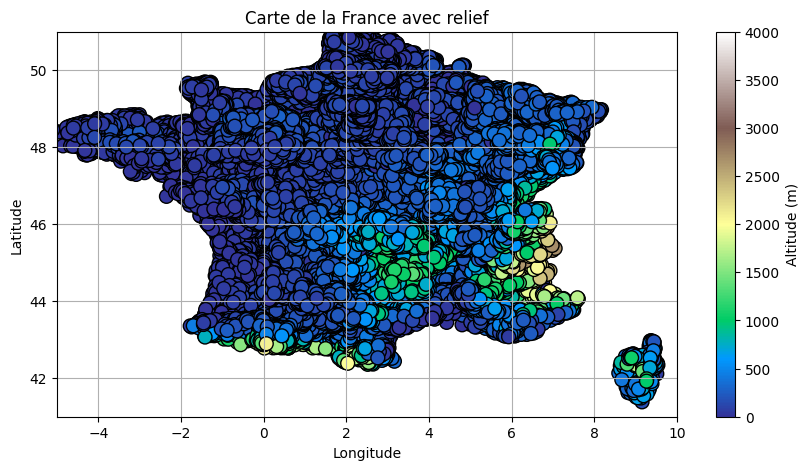

In [5]:
import matplotlib.pyplot as plt

# Créer la carte
fig, ax = plt.subplots(figsize=(10, 5))

# Ajouter les points avec relief
sc = ax.scatter(
    df["longitude_mairie"],
    df["latitude_mairie"],
    c=df["altitude_moyenne"],
    cmap="terrain",
    s=100,
    edgecolor="k",
    vmin=0,
    vmax=4000,
)

# Ajouter une barre de couleur pour l'altitude
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label("Altitude (m)")

plt.title("Carte de la France avec relief")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.xlim([-5, 10])  # Limites approximatives pour la France
plt.ylim([41, 51])  # Limites approximatives pour la France
plt.grid(True)
plt.show()

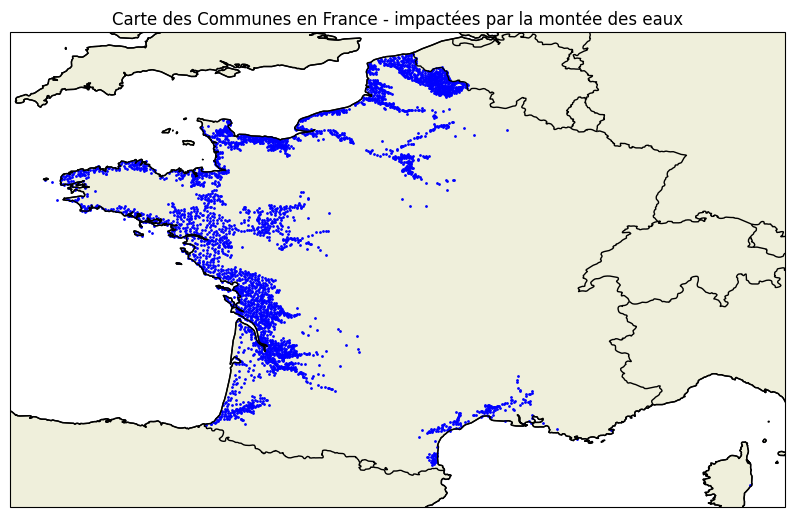

In [6]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Créer une carte
fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(10, 10))
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, edgecolor="black")

# Ajouter les communes
ax.scatter(
    df_immerge["longitude_mairie"],
    df_immerge["latitude_mairie"],
    color="blue",
    s=1,
    transform=ccrs.PlateCarree(),
)

plt.title("Carte des Communes en France - impactées par la montée des eaux")
plt.show()

In [7]:
import plotly.express as px

# Créer une carte avec Plotly: les altitudes doivent etre représentées en couleurs (type heatmap)
fig = px.scatter_map(
    df,
    lat="latitude_mairie",
    lon="longitude_mairie",
    color="altitude_moyenne",
    hover_name="nom_standard",
    zoom=5,
    height=600,
    color_continuous_scale="Viridis",
    title="Carte des Communes en France - Altitude",
)


fig.show()

In [8]:
# Créer une carte avec Plotly
fig = px.scatter_map(
    df_immerge,
    lat="latitude_mairie",
    lon="longitude_mairie",
    hover_name="nom_standard",  # Assurez-vous que cette colonne existe dans votre CSV
    hover_data=["altitude_moyenne"],
    color_discrete_sequence=["blue"],
    zoom=5,
    height=600,
)

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center_lat=df["latitude_mairie"].mean(axis=0),
    mapbox_center_lon=df["longitude_mairie"].mean(axis=0),
    title="Carte des Communes en France immergées par la montée des eaux",
)

fig.update_layout(margin={"r": 0, "t": 50, "l": 0, "b": 0})
fig.show()

### National Geographic

![image.png](results/national_geographic_result.png)